# From baseline to chosen model: the experiments and what they missed

This notebook reads the saved results in `results/` and tells the story in order. Nothing is retrained here.

**The story in five lines**

1. The classical baseline (six hand-crafted features, one per physical cue) reaches AUC 0.80 and collapses when the camera changes.
2. A patch CNN on native-resolution patches gets AUC 1.00. Too good: the attacks have 2.5x more pixels per face than the bona fide images, and the model could be using that.
3. Shrinking the attacks to bona fide pixel density at test time drops it to AUC 0.90. Part of the score was the density gap.
4. Two fixes. Normalising every face to the same size removes the gap but the model then collapses across cameras: the cues that survive shrinking are camera cues. Training with wide random downscaling keeps native resolution, keeps the camera transfer, and is the most robust under the density test. That is the chosen model.
5. Its remaining misses are far-range Samsung captures where the screen grid was never recorded. The model finds the screen in hair and edges, not in smooth skin.

All numbers are out-of-fold on the development folds (fold 4 locked) unless a row says phone transfer.

### Terms used in this notebook

- **Development set** (dev): the 820 images in folds 0 to 3 (19 attacks). Fold 4 is locked and never used until the final model is frozen.
- **Dev 4-fold**: hold out one of the four folds, train on the other three, score the held-out fold; repeat four times. Every image ends up with one score from a model that never saw it. Numbers labelled dev 4-fold are pooled over all 820 out-of-fold scores.
- **Phone transfer**: train on one phone's attacks and test on the other's. The closest thing we have to the hidden test set.
- **Attacks shrunk / density-matched**: at evaluation only, every attack face region is resized down to the bona fide median of 865 px before patches are cut. Tests whether the model depends on attacks having more pixels per face.
- **Full augmentation**: random changes applied to training patches only, same rules for both classes: mirror, small rescale (0.7x to 1.4x), tilt up to 5 degrees, brightness / contrast / saturation within 20 %, white balance shift, sensor noise, mild blur, JPEG recompression. Each stands in for a way a different phone or distance would change the capture. None adds a grid.
- **Wide augmentation**: full augmentation plus a random downscale of 0.35x to 1.0x on each training patch (a larger source crop shrunk to 128 px), so the model sees attacks at bona fide pixel density during training. Inference stays at native resolution.
- **Face-normalised**: every face region resized to 865 px at training and at evaluation. Removes the density difference by construction, and the grid along with it.

In [1]:
from pathlib import Path
import json
import numpy as np, pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import torch
import sys
ROOT = Path.cwd().parent if Path.cwd().name == "notebooks" else Path.cwd()
sys.path.insert(0, str(ROOT))
from pad import data as P, metrics as M
from pad.model import make_model, to_tensor, PATCH, FACENORM_PX

R = ROOT / "results"
J = lambda name: json.load(open(R / f"{name}.json"))
splits = pd.read_csv(ROOT / "derived" / "splits.csv"); dev = splits[~splits.locked].reset_index(drop=True)
cache = P.FaceCache()
plt.rcParams["figure.dpi"] = 100

def row(name, protocol, res):
    return dict(run=name, protocol=protocol, AUC=f"{res['auc']:.2f} [{res['auc_ci'][0]:.2f}, {res['auc_ci'][1]:.2f}]",
                **{"APCER @ BPCER 5%": f"{res['apcer@bpcer5']:.2f}", "attacks": res["n_attacks"]})
print("development set:", len(dev), "images,", int(dev.label.sum()), "attacks")

development set: 820 images, 19 attacks


### Gallery helper

For any run: the highest-scoring images in rank order, **red border = attack, green border = bona fide**, plus the attacks missed at 5 % BPCER and the bona fide images the run scores highest. Reading all runs through the same lens makes it obvious what each model gets wrong.

In [2]:
def load_scores(name):
    s = pd.read_csv(R / f"{name}.csv")
    if "cls" not in s: s["cls"] = np.where(s.label == 1, "Screens", "Bonafide")
    return s

def gallery(name, title, n=24, cols=8):
    s = load_scores(name).sort_values("score", ascending=False).reset_index(drop=True)
    thr = M.threshold_at_bpcer(s.score, s.label, .05)
    att, bona = s[s.label == 1], s[s.label == 0]
    missed = att[att.score <= thr]
    print(f"{title}")
    print(f"  AUC {M.auc(s.score, s.label):.3f}   5% BPCER threshold {thr:.3f}   attacks missed: {len(missed)} of {len(att)}",
          "->", [f"{f[:5]} ({p})" for f, p in zip(missed.file, missed.phone)] if len(missed) else "none")
    print(f"  attacks in the top {n}: {int(s.head(n).label.sum())} of {n}   bona fide scoring above the weakest attack: {int((bona.score > att.score.min()).sum())}")
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(2.1 * cols, 2.35 * rows))
    for a in axes.flat: a.axis("off")
    for a, r in zip(axes.flat, s.head(n).itertuples()):
        t = cache.region(r.cls, r.file); t.thumbnail((200, 200)); a.imshow(t)
        c = "red" if r.label == 1 else "green"
        for sp in a.spines.values(): sp.set_visible(True); sp.set_edgecolor(c); sp.set_linewidth(4)
        a.set_xticks([]); a.set_yticks([]); a.axis("on")
        a.set_title(f"#{r.Index + 1}  {r.file[:5]}  {r.score:.2f}", fontsize=8, color=c)
    fig.suptitle(f"{title}: top {n} by attack score  (red = attack, green = bona fide)", fontsize=11); plt.tight_layout()
    plt.show()
    return s

def high_bona(s, k=5):
    b = s[s.label == 0].head(k)[["file", "score"]].round(3)
    return b.rename(columns={"file": "highest-scoring bona fide", "score": "attack score"}).reset_index(drop=True)


## 1. The classical baseline

Six hand-crafted features, one per physical cue (sharpness, LBP texture, chroma spread, high-frequency energy, grid peaks at native resolution, specular ratio), computed on a 512 px face crop, into a logistic regression. Sixteen were tried first; six are kept for simplicity, same story. Trained and scored on the development folds, then trained on one phone and tested on the other.

In [3]:
b = J("baselines")
pd.DataFrame([row("classical", "dev 4-fold", b["classical_devcv"]),
              row("classical", "train iPhone, test Samsung", b["classical_lopo_test_Samsung"]),
              row("classical", "train Samsung, test iPhone", b["classical_lopo_test_iPhone"])])

,run,protocol,AUC,APCER @ BPCER 5%,attacks
0,classical,dev 4-fold,"0.79 [0.70, 0.87]",0.79,19
1,classical,"train iPhone, test Samsung","0.59 [0.44, 0.75]",0.88,8
2,classical,"train Samsung, test iPhone","0.52 [0.33, 0.71]",1.00,11


Classical baseline, dev 4-fold
  AUC 0.795   5% BPCER threshold 0.701   attacks missed: 15 of 19 -> ['10728 (iPhone)', '11099 (iPhone)', '10696 (iPhone)', '10972 (Samsung)', '08794 (iPhone)', '11040 (Samsung)', '11130 (iPhone)', '10684 (iPhone)', '10881 (Samsung)', '00998 (iPhone)', '10960 (Samsung)', '11117 (iPhone)', '10889 (Samsung)', '10992 (Samsung)', '10970 (Samsung)']
  attacks in the top 24: 4 of 24   bona fide scoring above the weakest attack: 628


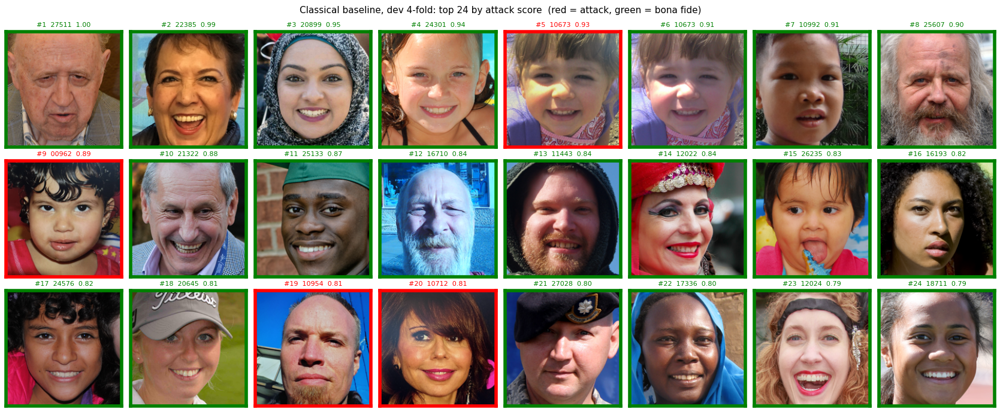

,highest-scoring bona fide,attack score
0,27511.png,0.997
1,22385.png,0.990
2,20899.png,0.950
3,24301.png,0.942
4,10673.png,0.915


In [4]:
s = gallery("oof_classical_devcv", "Classical baseline, dev 4-fold"); high_bona(s)

**Reading.** Mediocre on the development folds, chance across cameras. Grid peaks and fine energy carry the largest weights; the specular-highlight weight has the wrong sign because it reflects the flash-lit public photos rather than screens. The features learned the camera as much as the screen. This is the bar.

## 2. The patch CNN gets AUC 1.00, and why that is suspicious

Same folds, same metrics. The model sees 36 patches of 128 x 128 pixels cut from the face at native resolution, scores each, and averages.

In [5]:
n = J("patchcnn_none_devcv")
pd.DataFrame([row("patch CNN, no augmentation", "dev 4-fold", n["score"])])

,run,protocol,AUC,APCER @ BPCER 5%,attacks
0,"patch CNN, no augmentation",dev 4-fold,"1.00 [1.00, 1.00]",0.00,19


Patch CNN, no augmentation, native
  AUC 1.000   5% BPCER threshold 0.312   attacks missed: 0 of 19 -> none
  attacks in the top 24: 19 of 24   bona fide scoring above the weakest attack: 0


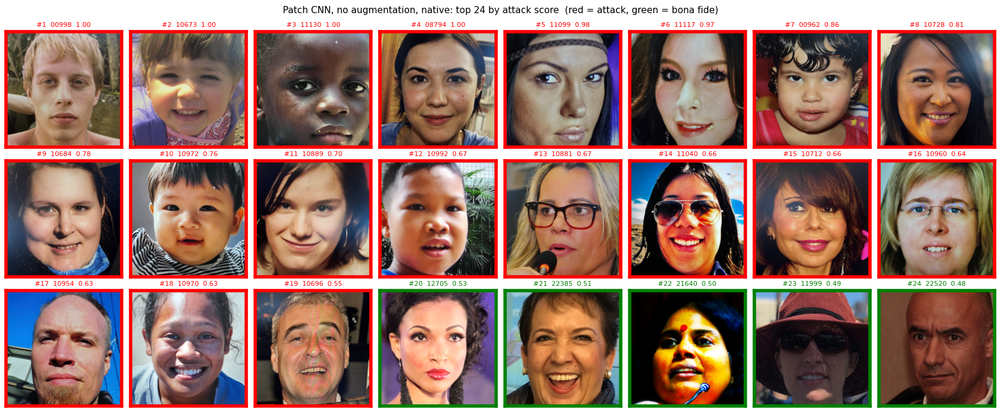

,highest-scoring bona fide,attack score
0,12705.png,0.529
1,22385.png,0.506
2,21640.png,0.499
3,11999.png,0.489
4,22520.png,0.484


In [6]:
s = gallery("scores_patchcnn_none_devcv", "Patch CNN, no augmentation, native"); high_bona(s)

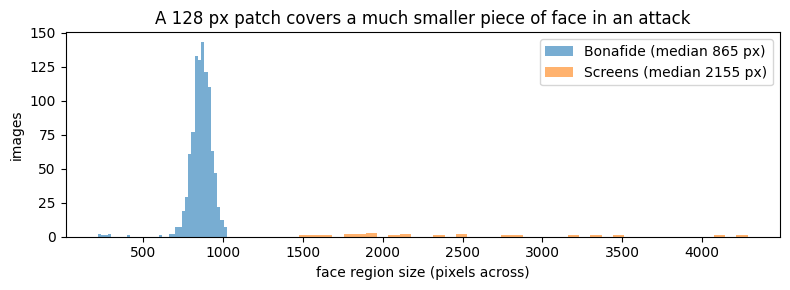

In [7]:
# The reason to distrust it: attacks have far more pixels per face than bona fide images.
b_ = cache.boxes.reset_index()
fig, ax = plt.subplots(figsize=(8, 3))
for cls, g in b_.groupby("cls"):
    ax.hist(g.region_px, bins=40, alpha=.6, label=f"{cls} (median {int(g.region_px.median())} px)")
ax.set(xlabel="face region size (pixels across)", ylabel="images", title="A 128 px patch covers a much smaller piece of face in an attack"); ax.legend(); plt.tight_layout()

**Reading.** A 128 px patch shows about 15 % of a bona fide face but 6 % of an attack face, so pores look bigger and smoother in attack patches. That is a fact about how this dataset was made (attacks photographed at 12 to 48 megapixels), not about screens, and a model can score perfectly on it. The perfect AUC is consistent with the model using it. We need to find out.

## 3. The density test

Re-score the same trained models with every attack face region shrunk to the bona fide median (865 px) before cutting patches. Bona fide images are untouched.

In [8]:
d = J("patchcnn_none_devcv_density")
pd.DataFrame([row("patch CNN, no aug., native", "dev 4-fold", n["score"]),
              row("patch CNN, no aug., attacks shrunk", "dev 4-fold", d["score"])])

,run,protocol,AUC,APCER @ BPCER 5%,attacks
0,"patch CNN, no aug., native",dev 4-fold,"1.00 [1.00, 1.00]",0.00,19
1,"patch CNN, no aug., attacks shrunk",dev 4-fold,"0.88 [0.80, 0.94]",0.53,19


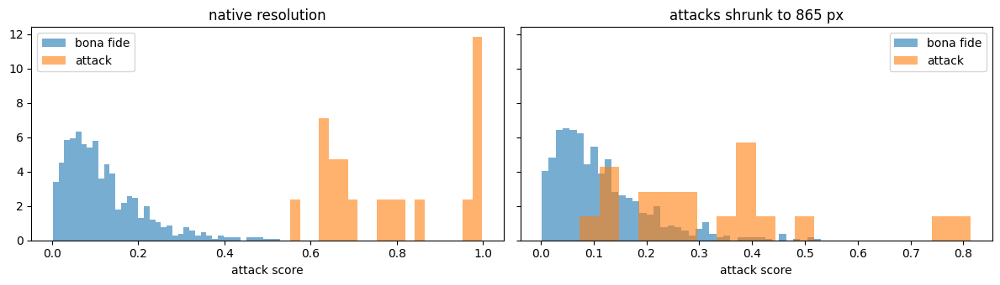

In [9]:
s_nat = pd.read_csv(R / "scores_patchcnn_none_devcv.csv"); s_den = pd.read_csv(R / "scores_patchcnn_none_devcv_density.csv")
fig, ax = plt.subplots(1, 2, figsize=(12, 3.5), sharey=True)
for a, s, t in ((ax[0], s_nat, "native resolution"), (ax[1], s_den, "attacks shrunk to 865 px")):
    a.hist(s[s.label == 0].score, bins=40, alpha=.6, density=True, label="bona fide"); a.hist(s[s.label == 1].score, bins=20, alpha=.6, density=True, label="attack")
    a.set(title=t, xlabel="attack score"); a.legend()
plt.tight_layout()

Patch CNN, no augmentation, attacks shrunk to 865 px
  AUC 0.877   5% BPCER threshold 0.299   attacks missed: 10 of 19 -> ['11099 (iPhone)', '11130 (iPhone)', '10712 (iPhone)', '10728 (iPhone)', '10696 (iPhone)', '10881 (Samsung)', '10970 (Samsung)', '11040 (Samsung)', '10954 (Samsung)', '10960 (Samsung)']
  attacks in the top 24: 8 of 24   bona fide scoring above the weakest attack: 469


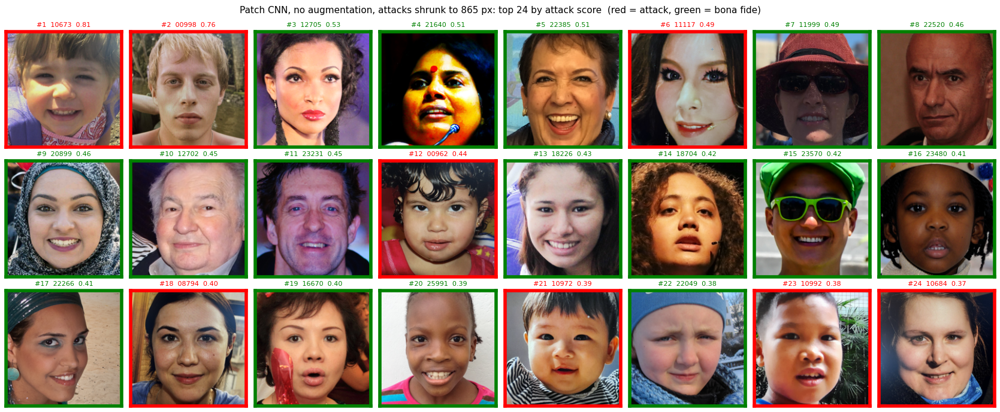

,highest-scoring bona fide,attack score
0,12705.png,0.531
1,21640.png,0.511
2,22385.png,0.506
3,11999.png,0.489
4,22520.png,0.463


In [10]:
s = gallery("scores_patchcnn_none_devcv_density", "Patch CNN, no augmentation, attacks shrunk to 865 px"); high_bona(s)

**Reading.** The attack scores slide left and 10 of 19 now fall below the 5 % BPCER threshold. So a large part of the perfect score depended on something that shrinking removes. But shrinking removes two things at once: the density cue we do not want, and the screen pixel grid we do want, which is exactly what happens in a real far-range attack. The 0.88 is a lower bound for far-range attacks, not a pure measure of cheating. We cannot separate the two with this test alone.

## 4. Two ways to handle density

**Face-normalised resolution.** Resize every face region to 865 px at training and test. The density cue is gone by construction; so is the grid on every attack.

**Wide downscale augmentation.** Keep native resolution at test time, but during training randomly shrink patches by 0.35x to 1.0x (both classes, same distribution). The model sees attacks at bona fide density often enough that density stops being reliable, while the grid is still there whenever the camera recorded it.

Both are run on the development folds and on the phone transfer. Full capture-variation augmentation (colour, blur, noise, JPEG) is on for both.

In [11]:
fn, fnl = J("patchcnn_full_devcv_facenorm"), J("patchcnn_full_lopo_facenorm")
w, wd, wl = J("patchcnn_wide_devcv"), J("patchcnn_wide_devcv_density"), J("patchcnn_wide_lopo")
f, fd, fl = J("patchcnn_full_devcv"), J("patchcnn_full_devcv_density"), J("patchcnn_full_lopo")
tS, tI = "train iPhone, test Samsung", "train Samsung, test iPhone"
pd.DataFrame([
    row("native, full aug.", "dev 4-fold", f["score"]), row("native, full aug.", "dev, attacks shrunk", fd["score"]),
    row("native, full aug.", tS, fl[tS]), row("native, full aug.", tI, fl[tI]),
    row("face-normalised (865 px)", "dev 4-fold", fn["score"]), row("face-normalised (865 px)", tS, fnl[tS]), row("face-normalised (865 px)", tI, fnl[tI]),
    row("wide downscale aug.", "dev 4-fold", w["score"]), row("wide downscale aug.", "dev, attacks shrunk", wd["score"]),
    row("wide downscale aug.", tS, wl[tS]), row("wide downscale aug.", tI, wl[tI]),
])

,run,protocol,AUC,APCER @ BPCER 5%,attacks
0,"native, full aug.",dev 4-fold,"1.00 [1.00, 1.00]",0.00,19
1,"native, full aug.","dev, attacks shrunk","0.90 [0.82, 0.96]",0.42,19
2,"native, full aug.","train iPhone, test Samsung","0.99 [0.97, 1.00]",0.00,8
3,"native, full aug.","train Samsung, test iPhone","1.00 [0.99, 1.00]",0.00,11
4,face-normalised (865 px),dev 4-fold,"0.96 [0.91, 0.99]",0.16,19
5,face-normalised (865 px),"train iPhone, test Samsung","0.69 [0.59, 0.78]",1.00,8
6,face-normalised (865 px),"train Samsung, test iPhone","0.72 [0.57, 0.86]",0.82,11
7,wide downscale aug.,dev 4-fold,"1.00 [1.00, 1.00]",0.00,19
8,wide downscale aug.,"dev, attacks shrunk","0.94 [0.88, 0.99]",0.26,19
9,wide downscale aug.,"train iPhone, test Samsung","0.99 [0.97, 1.00]",0.12,8


Face-normalised resolution, dev 4-fold
  AUC 0.959   5% BPCER threshold 0.318   attacks missed: 3 of 19 -> ['10954 (Samsung)', '10960 (Samsung)', '10970 (Samsung)']
  attacks in the top 24: 12 of 24   bona fide scoring above the weakest attack: 274


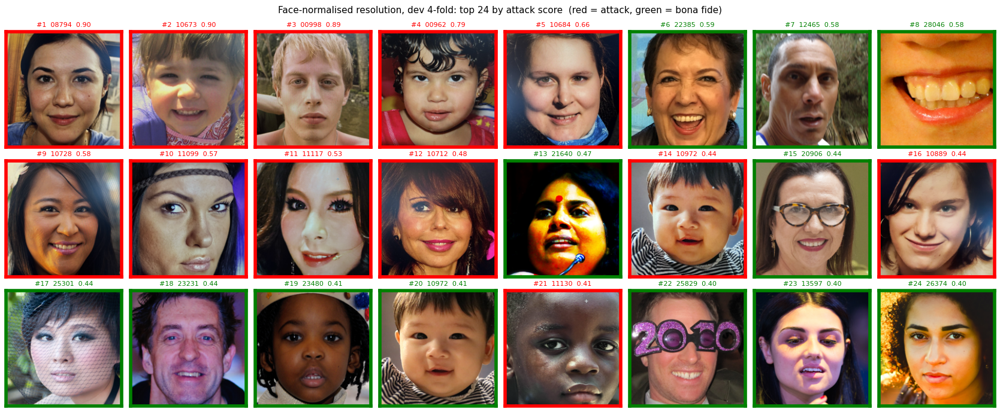

,highest-scoring bona fide,attack score
0,22385.png,0.594
1,12465.png,0.584
2,28046.png,0.581
3,21640.png,0.474
4,20906.png,0.442


In [12]:
s = gallery("scores_patchcnn_full_devcv_facenorm", "Face-normalised resolution, dev 4-fold"); high_bona(s)

Wide downscale augmentation, native (chosen model)
  AUC 0.999   5% BPCER threshold 0.430   attacks missed: 0 of 19 -> none
  attacks in the top 24: 19 of 24   bona fide scoring above the weakest attack: 3


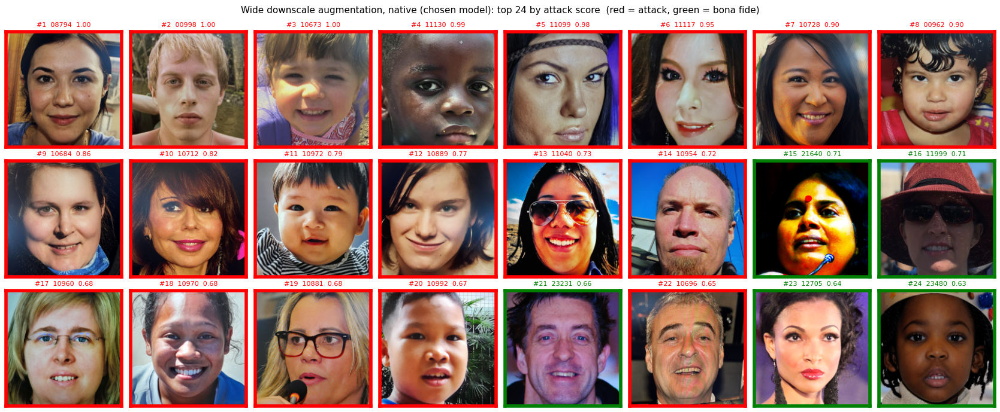

,highest-scoring bona fide,attack score
0,21640.png,0.710
1,11999.png,0.709
2,23231.png,0.664
3,12705.png,0.643
4,23480.png,0.634


In [13]:
s = gallery("scores_patchcnn_wide_devcv", "Wide downscale augmentation, native (chosen model)"); high_bona(s)

Wide downscale augmentation, attacks shrunk to 865 px
  AUC 0.945   5% BPCER threshold 0.419   attacks missed: 5 of 19 -> ['10881 (Samsung)', '11040 (Samsung)', '10954 (Samsung)', '10970 (Samsung)', '10960 (Samsung)']
  attacks in the top 24: 11 of 24   bona fide scoring above the weakest attack: 425


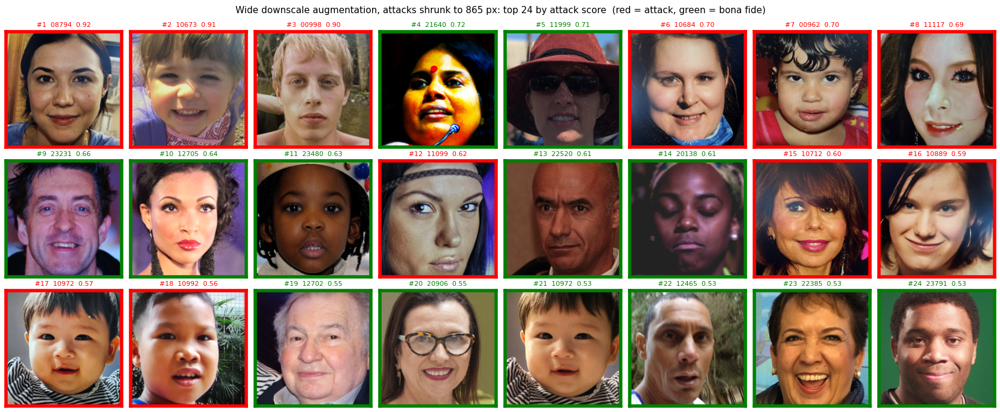

,highest-scoring bona fide,attack score
0,21640.png,0.719
1,11999.png,0.709
2,23231.png,0.658
3,12705.png,0.639
4,23480.png,0.634


In [14]:
s = gallery("scores_patchcnn_wide_devcv_density", "Wide downscale augmentation, attacks shrunk to 865 px"); high_bona(s)

**Reading.**

- *Face-normalised* still reaches AUC 0.96 on the development folds, so the earlier 0.88 understated what is learnable without the density gap. But it collapses across cameras, to the same level as the classical baseline. Once the grid is shrunk away, what remains for the model to learn is colour cast and noise texture, which belong to the camera. Normalising resolution trades a resolution shortcut for a camera shortcut.
- *Wide augmentation* keeps the native ceiling, is the most robust of all models when attacks are shrunk (5 of 19 missed against 8 for full augmentation and 10 for none), and keeps the camera transfer. **This is the chosen model.**
- One caveat on the face-normalised number: attacks were shrunk 1.7x to 5x while bona fide images were barely resampled, so "heavily resampled" correlated with "attack". Its transfer collapse makes the number moot anyway.

## 5. Error analysis on the chosen model

Every development image scored by the fold model that did not train on it, under five conditions: native, and with one cue removed at a time (blur removes fine detail, grayscale removes colour, shrinking removes density and grid, a median filter removes noise). `ea_scores.csv` holds all of it.

thresholds: 5% BPCER 0.430   1% BPCER 0.592
attack scores: min 0.649  median 0.818
bona fide scores: median 0.215  99th pct 0.592  max 0.710
attacks below the 1% threshold: 0  bona fide above the lowest attack: 3


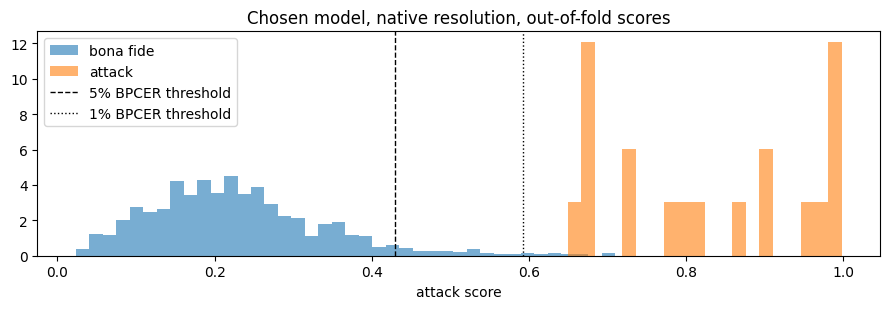

In [15]:
ea = pd.read_csv(R / "ea_scores.csv"); att = ea[ea.label == 1].sort_values("native"); bona = ea[ea.label == 0].sort_values("native", ascending=False)
thr5, thr1 = M.threshold_at_bpcer(ea.native, ea.label, .05), M.threshold_at_bpcer(ea.native, ea.label, .01)
print(f"thresholds: 5% BPCER {thr5:.3f}   1% BPCER {thr1:.3f}")
print(f"attack scores: min {att.native.min():.3f}  median {att.native.median():.3f}")
print(f"bona fide scores: median {bona.native.median():.3f}  99th pct {bona.native.quantile(.99):.3f}  max {bona.native.max():.3f}")
print("attacks below the 1% threshold:", int((att.native <= thr1).sum()), " bona fide above the lowest attack:", int((bona.native > att.native.min()).sum()))
fig, ax = plt.subplots(figsize=(9, 3.2))
ax.hist(bona.native, bins=40, alpha=.6, density=True, label="bona fide"); ax.hist(att.native, bins=20, alpha=.6, density=True, label="attack")
ax.axvline(thr5, color="k", ls="--", lw=1, label="5% BPCER threshold"); ax.axvline(thr1, color="k", ls=":", lw=1, label="1% BPCER threshold")
ax.set(title="Chosen model, native resolution, out-of-fold scores", xlabel="attack score"); ax.legend(); plt.tight_layout()

**Reading.** No attack is missed at either threshold, but the margin is thin: the weakest attacks score 0.65 to 0.68 and the 1 % threshold is 0.59. Three bona fide images score above the weakest attack. That margin is what a shifted hidden set would eat first.

### What the model keys on

Remove one cue and measure the drop in attack score, averaged per group.

,iPhone attacks,Samsung attacks,bona fide
density + grid (shrink),0.232,0.290,0.010
fine detail (blur),0.089,0.083,-0.038
noise (median),0.069,0.100,-0.027
colour (grayscale),0.002,-0.036,-0.062


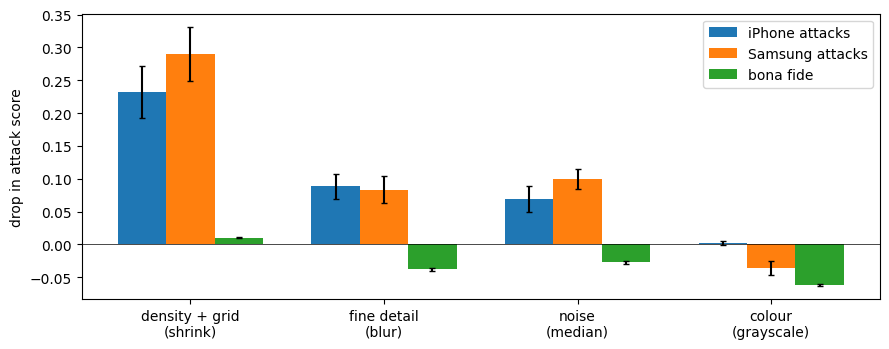

In [16]:
cues = {"drop_density_matched": "density + grid\n(shrink)", "drop_no_fine_detail": "fine detail\n(blur)", "drop_no_noise": "noise\n(median)", "drop_no_colour": "colour\n(grayscale)"}
groups = [("iPhone attacks", ea[(ea.label == 1) & (ea.phone == "iPhone")]), ("Samsung attacks", ea[(ea.label == 1) & (ea.phone == "Samsung")]), ("bona fide", ea[ea.label == 0])]
fig, ax = plt.subplots(figsize=(9, 3.6)); wdt = .25
for j, (nm, g) in enumerate(groups):
    ax.bar(np.arange(len(cues)) + (j - 1) * wdt, [g[c].mean() for c in cues], wdt, label=nm, yerr=[g[c].std() / np.sqrt(len(g)) for c in cues], capsize=2)
ax.axhline(0, color="k", lw=.5); ax.set_xticks(range(len(cues))); ax.set_xticklabels(cues.values()); ax.set_ylabel("drop in attack score"); ax.legend(); plt.tight_layout()
pd.DataFrame({nm: {v.replace("\n", " "): round(g[c].mean(), 3) for c, v in cues.items()} for nm, g in groups})

**Reading.** The dominant cue is fine-scale structure that disappears when the image is shrunk: grid, moire, aliasing. Fine detail and noise are secondary. Colour is not used to detect attacks at all; if anything, colour helps the model recognise real skin. That matters for transfer, because colour cast is the camera-specific cue the classical model collapsed on.

### The attacks that get through under the density test

All five are Samsung captures and they are also the five weakest attacks at native resolution. For each: the face region, the 36 patch scores drawn over it (red = attack), and the score under each cue removal.

5 attacks missed under the density test at 5% BPCER


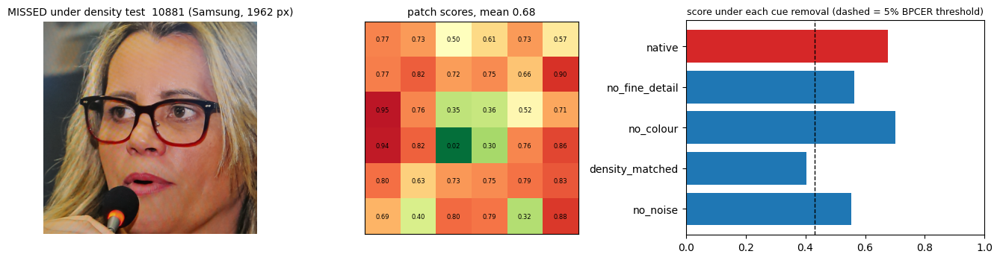

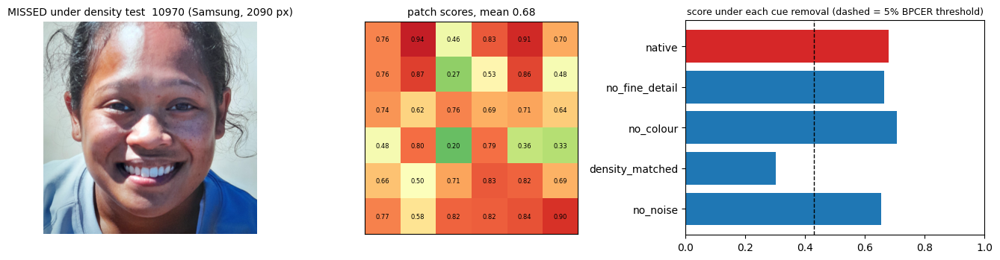

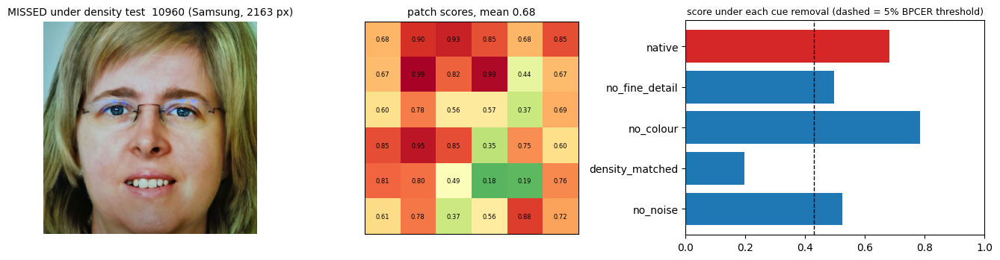

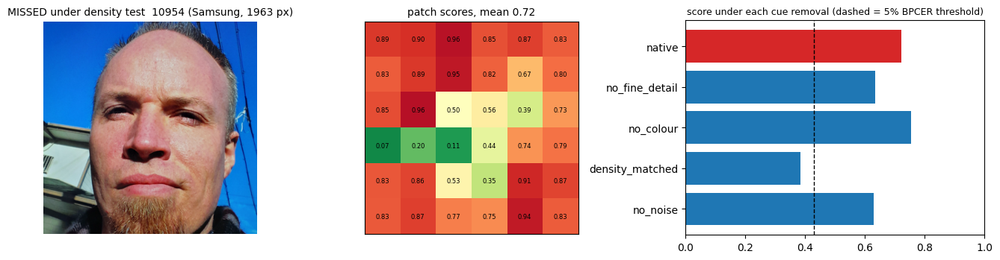

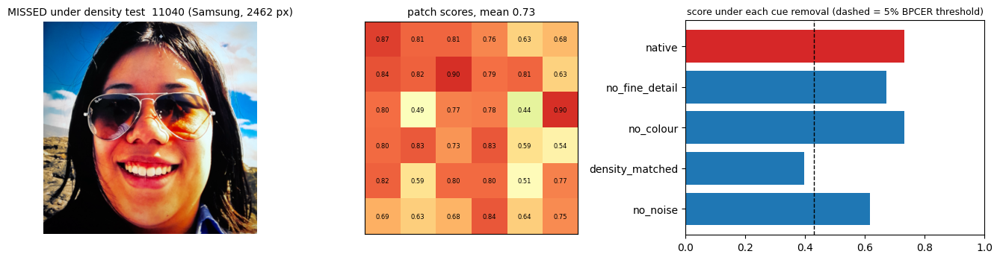

In [17]:
models = {}
for k in sorted(dev.fold.unique()):
    m = make_model(); m.load_state_dict(torch.load(R / f"patchcnn_wide_devcv_fold_{k}.pt")); m.eval(); models[k] = m

@torch.no_grad()
def patch_map(cls, f):
    reg = cache.region(cls, f); m = models[int(dev[(dev.cls == cls) & (dev.file == f)].fold.iloc[0])]
    x = torch.stack([to_tensor(P.crop_patch(reg, xy, PATCH)) for xy in P.patch_grid(reg, PATCH)])
    return reg, torch.sigmoid(m(x).squeeze(1)).numpy().reshape(6, 6)

def show(cls, f, title):
    reg, pm = patch_map(cls, f); r = ea[(ea.cls == cls) & (ea.file == f)].iloc[0]
    fig, ax = plt.subplots(1, 3, figsize=(13, 3.6), gridspec_kw={"width_ratios": [1, 1, 1.4]})
    t = reg.copy(); t.thumbnail((360, 360)); ax[0].imshow(t); ax[0].set_title(f"{title}  {f[:5]} ({r.phone}, {r.region_px} px)", fontsize=10); ax[0].axis("off")
    ax[1].imshow(pm, vmin=0, vmax=1, cmap="RdYlGn_r"); ax[1].set_title(f"patch scores, mean {pm.mean():.2f}", fontsize=10); ax[1].set_xticks([]); ax[1].set_yticks([])
    for (yy, xx), v in np.ndenumerate(pm): ax[1].text(xx, yy, f"{v:.2f}", ha="center", va="center", fontsize=6)
    conds = ["native", "no_fine_detail", "no_colour", "density_matched", "no_noise"]
    ax[2].barh(conds[::-1], [r[c] for c in conds][::-1], color=["C3" if c == "native" else "C0" for c in conds][::-1])
    ax[2].axvline(thr5, color="k", ls="--", lw=1); ax[2].set_xlim(0, 1); ax[2].set_title("score under each cue removal (dashed = 5% BPCER threshold)", fontsize=9)
    plt.tight_layout()

thr5_d = M.threshold_at_bpcer(ea.density_matched, ea.label, .05)
missed = att[att.density_matched <= thr5_d]
print(f"{len(missed)} attacks missed under the density test at 5% BPCER")
for f in missed.file: show("Screens", f, "MISSED under density test")

**Reading.** The patch maps show where the model sees the screen: hair, glasses, edges, background, at 0.8 to 0.95. Smooth skin on cheeks and forehead scores 0.1 to 0.4. A far-range capture of smooth skin looks like skin; the model has nothing there. The ablation bars show shrinking is the only removal that pushes these below threshold, and grayscale does nothing, so colour is not what carries them.

### The easiest attacks, for contrast

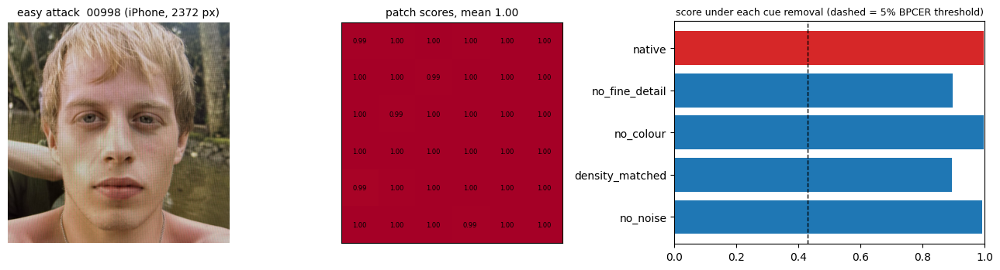

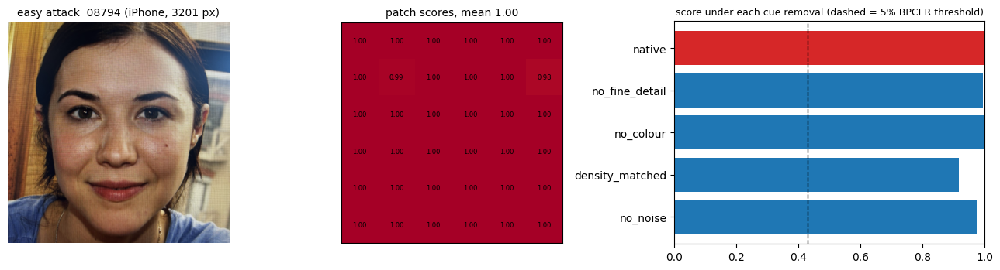

In [18]:
for f in att.tail(2).file: show("Screens", f, "easy attack")

**Reading.** Close-range captures light up every patch at 1.00. The grid is everywhere.

### The bona fide images the model likes least

The false-alarm risk: what does a real image have to look like to score high?

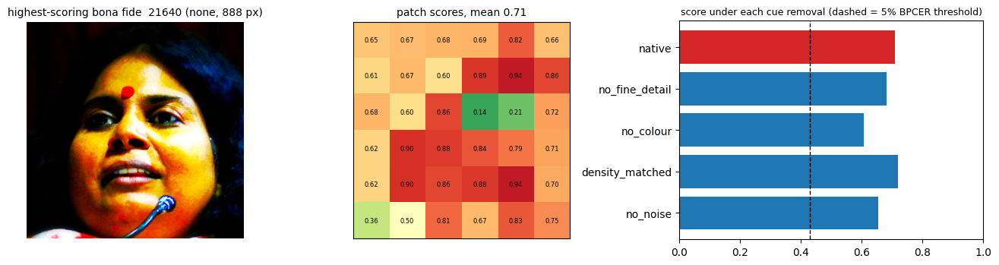

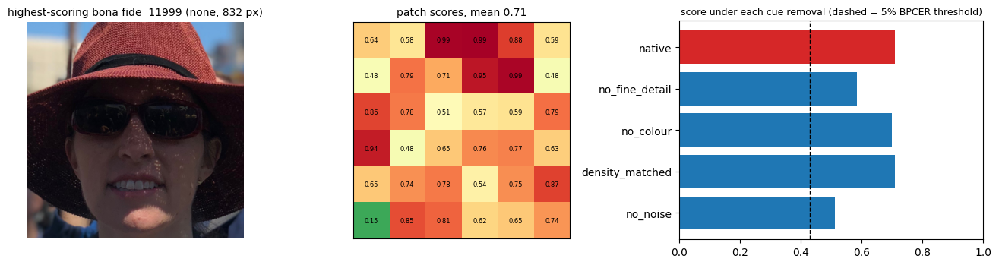

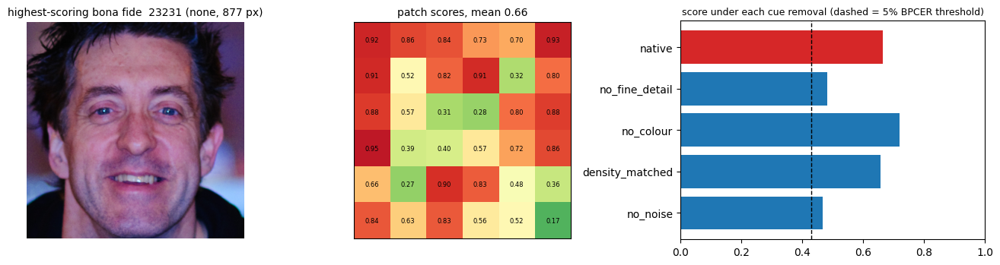

In [19]:
for f in bona.head(3).file: show("Bonafide", f, "highest-scoring bona fide")

**Reading.** Harsh stage lighting, a woven hat with sunglasses, flash with a strong colour cast. High-scoring patches sit on fabric weave and highlight edges. Real users in the wild will bring lighting like this, so this is a stated risk, not a footnote.

## 6. Conclusion

- The perfect AUC was partly the density gap. The test that showed it also destroys real screen evidence, so it is a lower bound, not a verdict.
- Removing the gap by normalising resolution is the wrong fix here: it swaps a resolution shortcut for a camera shortcut and the model stops transferring.
- Training with wide random downscaling at native resolution is the right fix with this data: same ceiling, best robustness under shrinking, camera transfer intact.
- The chosen model detects screens through fine-scale structure the camera resolved. It does not use colour. Its misses are far-range captures of smooth skin; its false-alarm risk is harsh lighting and fabric texture.
- The only complete fix for density is data: bona fide images captured through the same phones. Until then, far-range attacks are the stated weakness.